# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

A subdirectory or file data already exists.


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

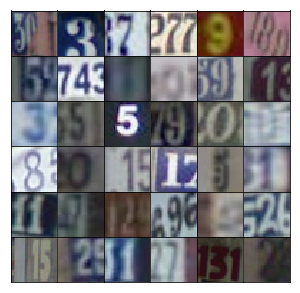

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    out_dim =[-1,4,4,512]
    init_dim = 4*4*512
    filters = 1024
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x = tf.layers.dense(z,init_dim)
        x = tf.reshape(x, tf.cast(out_dim, tf.int32))
        x = tf.layers.batch_normalization(x, training = training)
        x = tf.contrib.keras.layers.LeakyReLU(alpha)(x)
        for i in range(3):
            if i<2:
                filters = filters/2
            else:
                filters = 3
                
            x = tf.layers.conv2d_transpose(inputs = x, 
                                           filters = int(filters), 
                                           kernel_size =5,
                                           strides = 2,
                                           padding = 'same')
                                           
            x = tf.layers.batch_normalization(x, training = training)
            if i < 2:
                x = tf.contrib.keras.layers.LeakyReLU(alpha)(x)
        
        # Output layer, 32x32x3
        logits = x
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        filters = 128
        # Input layer is 32x32x3
        for i in range(3):
            x = tf.layers.conv2d(inputs = x, 
                                 filters = filters, 
                                 kernel_size = [2,2], 
                                 padding="same",
                                activation = tf.contrib.keras.layers.LeakyReLU(alpha))
            x = tf.layers.batch_normalization(x, training = True)
            if i < 2:
                x = tf.contrib.keras.layers.LeakyReLU(alpha)(x)
                filters = 2*filters
        
        flat = tf.contrib.layers.flatten(x)
        logits = tf.layers.dense(flat,1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [16]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 16
epochs = 20
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/20... Discriminator Loss: 0.0046... Generator Loss: 41.3286
Epoch 1/20... Discriminator Loss: 0.0004... Generator Loss: 43.2523
Epoch 1/20... Discriminator Loss: 0.2130... Generator Loss: 1.7577
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 20.6118
Epoch 1/20... Discriminator Loss: 8.9499... Generator Loss: 0.0005
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 119.3349
Epoch 1/20... Discriminator Loss: 0.0002... Generator Loss: 14.7982
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 44.0143
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 126.4047
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 22.1954


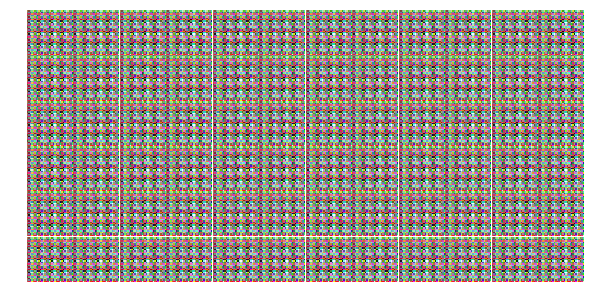

Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 75.8292
Epoch 1/20... Discriminator Loss: 0.0001... Generator Loss: 161.4366
Epoch 1/20... Discriminator Loss: 0.2317... Generator Loss: 2.4836
Epoch 1/20... Discriminator Loss: 4.8962... Generator Loss: 0.0097
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 31.9165
Epoch 1/20... Discriminator Loss: 0.0004... Generator Loss: 38.3640
Epoch 1/20... Discriminator Loss: 0.0004... Generator Loss: 8.7184
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 26.6446
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 102.1127
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 29.8386


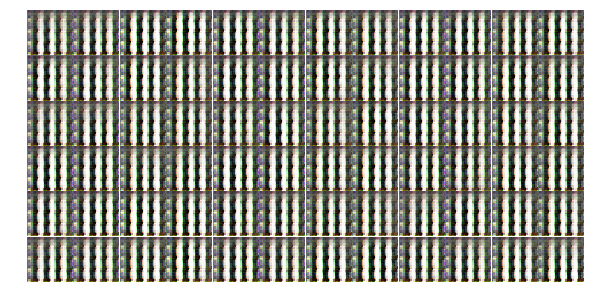

Epoch 1/20... Discriminator Loss: 0.0005... Generator Loss: 131.2802
Epoch 1/20... Discriminator Loss: 4.6070... Generator Loss: 123.1143
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 112.6384
Epoch 1/20... Discriminator Loss: 16.2413... Generator Loss: 7.5968
Epoch 1/20... Discriminator Loss: 11.1308... Generator Loss: 20.3376
Epoch 1/20... Discriminator Loss: 7.0448... Generator Loss: 6.1770
Epoch 1/20... Discriminator Loss: 3.3214... Generator Loss: 15.8076
Epoch 1/20... Discriminator Loss: 0.5151... Generator Loss: 27.8368
Epoch 1/20... Discriminator Loss: 0.6956... Generator Loss: 25.7082
Epoch 1/20... Discriminator Loss: 0.1551... Generator Loss: 24.4805


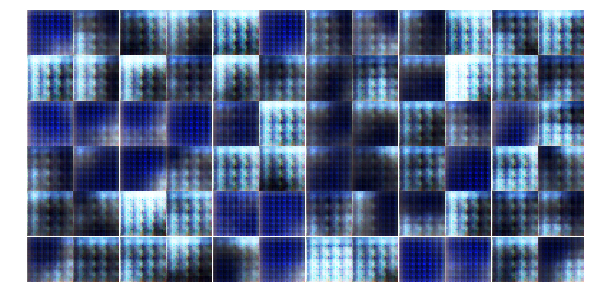

Epoch 1/20... Discriminator Loss: 1.3316... Generator Loss: 35.4865
Epoch 1/20... Discriminator Loss: 1.3126... Generator Loss: 21.2431
Epoch 1/20... Discriminator Loss: 0.6992... Generator Loss: 10.3368
Epoch 1/20... Discriminator Loss: 28.7299... Generator Loss: 0.6065
Epoch 1/20... Discriminator Loss: 0.1169... Generator Loss: 17.7768
Epoch 1/20... Discriminator Loss: 1.3047... Generator Loss: 53.6334
Epoch 1/20... Discriminator Loss: 0.8689... Generator Loss: 41.3596
Epoch 1/20... Discriminator Loss: 2.9407... Generator Loss: 13.2014
Epoch 1/20... Discriminator Loss: 7.1984... Generator Loss: 17.3552
Epoch 1/20... Discriminator Loss: 3.7812... Generator Loss: 10.3936


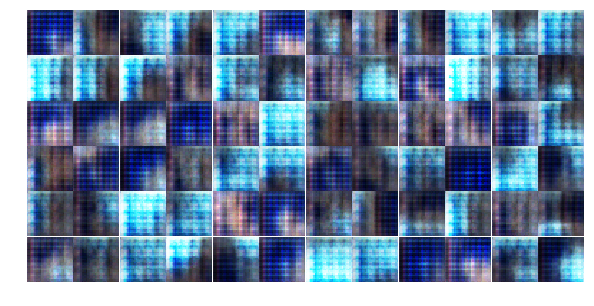

Epoch 1/20... Discriminator Loss: 1.9722... Generator Loss: 28.0197
Epoch 1/20... Discriminator Loss: 8.4513... Generator Loss: 6.2748
Epoch 1/20... Discriminator Loss: 3.5672... Generator Loss: 10.1192
Epoch 1/20... Discriminator Loss: 1.2091... Generator Loss: 28.0488
Epoch 1/20... Discriminator Loss: 3.3766... Generator Loss: 8.0274
Epoch 1/20... Discriminator Loss: 3.2751... Generator Loss: 40.9444
Epoch 1/20... Discriminator Loss: 3.4663... Generator Loss: 9.1455
Epoch 1/20... Discriminator Loss: 0.0011... Generator Loss: 45.9508
Epoch 1/20... Discriminator Loss: 3.2001... Generator Loss: 18.5325
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 34.4808


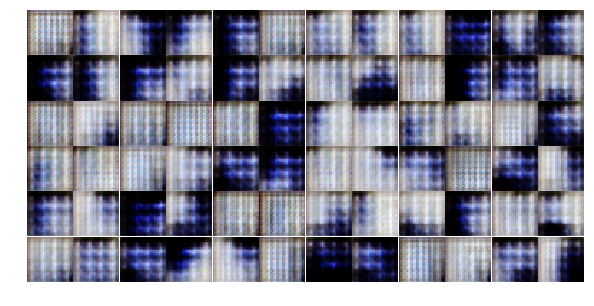

Epoch 1/20... Discriminator Loss: 0.7481... Generator Loss: 46.3598
Epoch 1/20... Discriminator Loss: 1.3896... Generator Loss: 11.2322
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 76.8062
Epoch 1/20... Discriminator Loss: 0.8115... Generator Loss: 60.5069
Epoch 1/20... Discriminator Loss: 1.2281... Generator Loss: 23.9201
Epoch 1/20... Discriminator Loss: 4.5734... Generator Loss: 39.9414
Epoch 1/20... Discriminator Loss: 7.5416... Generator Loss: 30.0109
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 40.2828
Epoch 1/20... Discriminator Loss: 9.4610... Generator Loss: 64.6335
Epoch 1/20... Discriminator Loss: 0.4599... Generator Loss: 37.0990


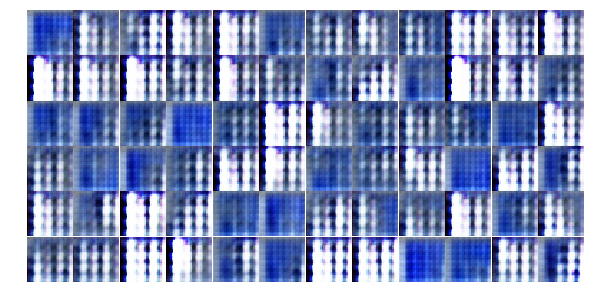

Epoch 1/20... Discriminator Loss: 2.1341... Generator Loss: 22.6394
Epoch 1/20... Discriminator Loss: 1.7598... Generator Loss: 35.8756
Epoch 1/20... Discriminator Loss: 0.0018... Generator Loss: 53.8342
Epoch 1/20... Discriminator Loss: 1.0149... Generator Loss: 17.9662
Epoch 1/20... Discriminator Loss: 1.4879... Generator Loss: 12.6760
Epoch 1/20... Discriminator Loss: 1.1073... Generator Loss: 62.1318
Epoch 1/20... Discriminator Loss: 2.9058... Generator Loss: 15.2086
Epoch 1/20... Discriminator Loss: 0.3507... Generator Loss: 46.6452
Epoch 1/20... Discriminator Loss: 1.1720... Generator Loss: 64.4703
Epoch 1/20... Discriminator Loss: 5.5519... Generator Loss: 37.1132


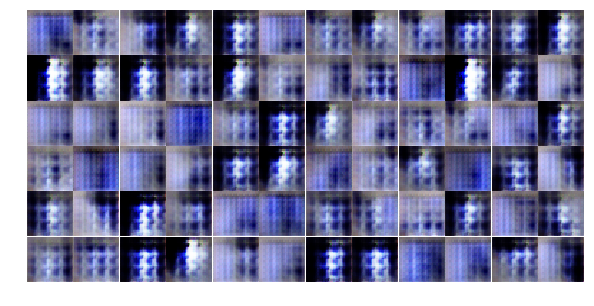

Epoch 1/20... Discriminator Loss: 0.0504... Generator Loss: 53.2572
Epoch 1/20... Discriminator Loss: 0.0009... Generator Loss: 63.1658
Epoch 1/20... Discriminator Loss: 8.3031... Generator Loss: 20.1393
Epoch 1/20... Discriminator Loss: 3.4705... Generator Loss: 15.4364
Epoch 1/20... Discriminator Loss: 0.4434... Generator Loss: 19.0542
Epoch 1/20... Discriminator Loss: 8.3429... Generator Loss: 3.1904
Epoch 1/20... Discriminator Loss: 20.7936... Generator Loss: 47.3590
Epoch 1/20... Discriminator Loss: 0.0687... Generator Loss: 23.5283
Epoch 1/20... Discriminator Loss: 1.2775... Generator Loss: 34.5874
Epoch 1/20... Discriminator Loss: 4.7332... Generator Loss: 58.1598


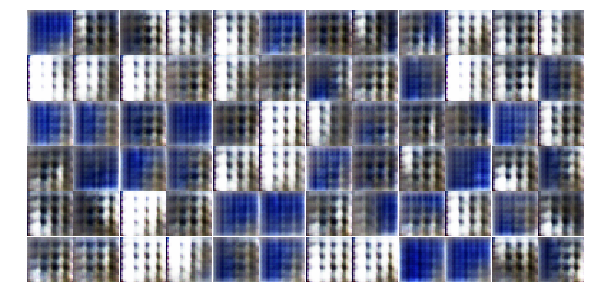

Epoch 1/20... Discriminator Loss: 1.9106... Generator Loss: 9.6376
Epoch 1/20... Discriminator Loss: 4.9413... Generator Loss: 9.7790
Epoch 1/20... Discriminator Loss: 2.4266... Generator Loss: 18.6198
Epoch 1/20... Discriminator Loss: 8.1375... Generator Loss: 5.6588
Epoch 1/20... Discriminator Loss: 5.7180... Generator Loss: 8.5253
Epoch 1/20... Discriminator Loss: 9.6431... Generator Loss: 2.0881
Epoch 1/20... Discriminator Loss: 0.0001... Generator Loss: 34.8958
Epoch 1/20... Discriminator Loss: 2.1086... Generator Loss: 36.1680
Epoch 1/20... Discriminator Loss: 3.1530... Generator Loss: 14.3430
Epoch 1/20... Discriminator Loss: 1.4469... Generator Loss: 20.9662


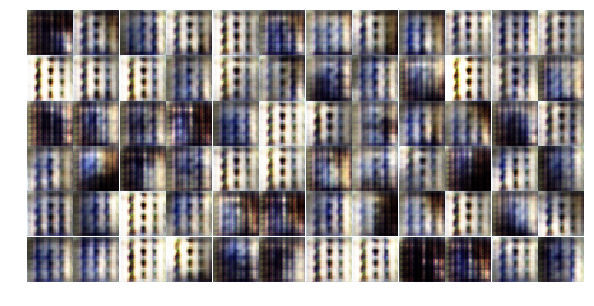

Epoch 1/20... Discriminator Loss: 0.0357... Generator Loss: 19.4838
Epoch 1/20... Discriminator Loss: 0.8264... Generator Loss: 64.4438
Epoch 1/20... Discriminator Loss: 1.0474... Generator Loss: 47.5181
Epoch 1/20... Discriminator Loss: 12.7250... Generator Loss: 4.3697
Epoch 1/20... Discriminator Loss: 1.0216... Generator Loss: 12.4525
Epoch 1/20... Discriminator Loss: 2.1591... Generator Loss: 31.1904
Epoch 1/20... Discriminator Loss: 14.3039... Generator Loss: 13.2209
Epoch 1/20... Discriminator Loss: 1.4721... Generator Loss: 13.0582
Epoch 1/20... Discriminator Loss: 0.5098... Generator Loss: 24.7841
Epoch 1/20... Discriminator Loss: 0.3582... Generator Loss: 31.9792


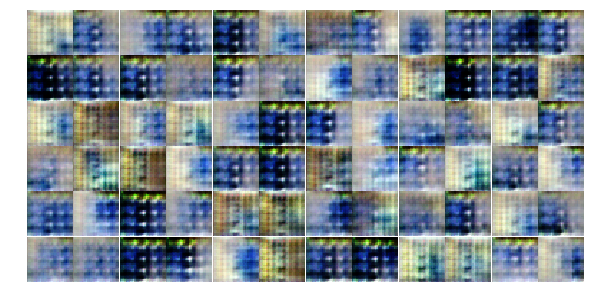

Epoch 1/20... Discriminator Loss: 0.6952... Generator Loss: 23.6746
Epoch 1/20... Discriminator Loss: 9.1798... Generator Loss: 1.6521
Epoch 1/20... Discriminator Loss: 4.3179... Generator Loss: 45.0204
Epoch 1/20... Discriminator Loss: 0.0006... Generator Loss: 26.5325
Epoch 1/20... Discriminator Loss: 3.7401... Generator Loss: 45.9198
Epoch 1/20... Discriminator Loss: 8.7523... Generator Loss: 10.1595
Epoch 1/20... Discriminator Loss: 2.0453... Generator Loss: 57.6179
Epoch 1/20... Discriminator Loss: 2.5703... Generator Loss: 17.7001
Epoch 1/20... Discriminator Loss: 0.0714... Generator Loss: 39.1619
Epoch 1/20... Discriminator Loss: 1.4072... Generator Loss: 31.2602


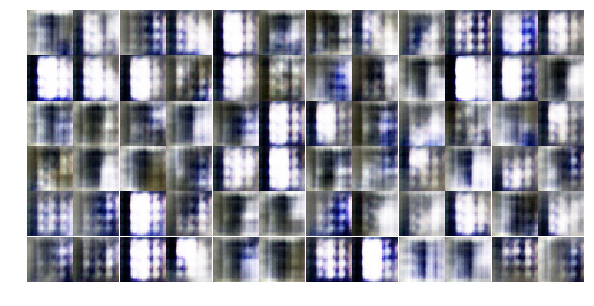

Epoch 1/20... Discriminator Loss: 1.7600... Generator Loss: 24.2374
Epoch 1/20... Discriminator Loss: 1.5720... Generator Loss: 46.8407
Epoch 1/20... Discriminator Loss: 0.0001... Generator Loss: 22.6049
Epoch 1/20... Discriminator Loss: 2.2061... Generator Loss: 13.0901
Epoch 1/20... Discriminator Loss: 1.4515... Generator Loss: 42.6750
Epoch 1/20... Discriminator Loss: 13.5429... Generator Loss: 9.7761
Epoch 1/20... Discriminator Loss: 2.0714... Generator Loss: 7.6543
Epoch 1/20... Discriminator Loss: 0.0029... Generator Loss: 30.0013
Epoch 1/20... Discriminator Loss: 0.8175... Generator Loss: 23.1672
Epoch 1/20... Discriminator Loss: 15.8526... Generator Loss: 2.9531


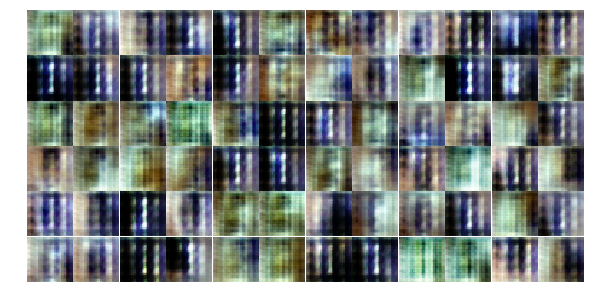

Epoch 1/20... Discriminator Loss: 8.0574... Generator Loss: 14.3909
Epoch 1/20... Discriminator Loss: 0.1775... Generator Loss: 20.9648
Epoch 1/20... Discriminator Loss: 5.1661... Generator Loss: 6.9514
Epoch 1/20... Discriminator Loss: 26.9486... Generator Loss: 3.6809
Epoch 1/20... Discriminator Loss: 6.7065... Generator Loss: 53.9312
Epoch 1/20... Discriminator Loss: 2.8461... Generator Loss: 12.5340
Epoch 1/20... Discriminator Loss: 0.8599... Generator Loss: 16.8964
Epoch 1/20... Discriminator Loss: 0.7929... Generator Loss: 62.0279
Epoch 1/20... Discriminator Loss: 0.0628... Generator Loss: 18.2264
Epoch 1/20... Discriminator Loss: 0.0815... Generator Loss: 22.9044


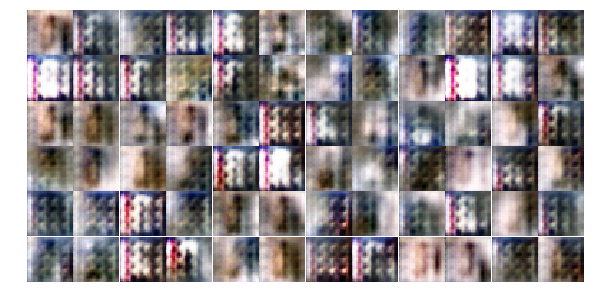

Epoch 1/20... Discriminator Loss: 1.9097... Generator Loss: 13.3681
Epoch 1/20... Discriminator Loss: 10.3353... Generator Loss: 20.7295
Epoch 1/20... Discriminator Loss: 1.3358... Generator Loss: 21.6590
Epoch 1/20... Discriminator Loss: 1.2138... Generator Loss: 16.1651
Epoch 1/20... Discriminator Loss: 3.0025... Generator Loss: 100.6138
Epoch 1/20... Discriminator Loss: 0.5535... Generator Loss: 27.5114
Epoch 1/20... Discriminator Loss: 6.7059... Generator Loss: 9.0846
Epoch 1/20... Discriminator Loss: 3.7632... Generator Loss: 27.9338
Epoch 1/20... Discriminator Loss: 6.6915... Generator Loss: 9.2239
Epoch 1/20... Discriminator Loss: 1.9790... Generator Loss: 19.3635


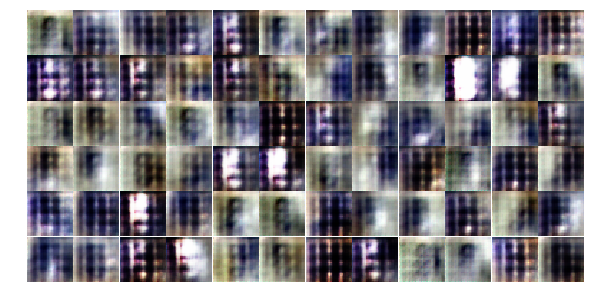

Epoch 1/20... Discriminator Loss: 4.4349... Generator Loss: 7.3372
Epoch 1/20... Discriminator Loss: 0.0752... Generator Loss: 21.7369
Epoch 1/20... Discriminator Loss: 3.1040... Generator Loss: 20.0209
Epoch 1/20... Discriminator Loss: 0.4026... Generator Loss: 38.4286
Epoch 1/20... Discriminator Loss: 0.0001... Generator Loss: 39.9678
Epoch 1/20... Discriminator Loss: 0.1319... Generator Loss: 15.5036
Epoch 1/20... Discriminator Loss: 4.3314... Generator Loss: 22.5258
Epoch 1/20... Discriminator Loss: 1.7928... Generator Loss: 20.6002
Epoch 1/20... Discriminator Loss: 0.9321... Generator Loss: 17.6163
Epoch 1/20... Discriminator Loss: 0.4564... Generator Loss: 20.2821


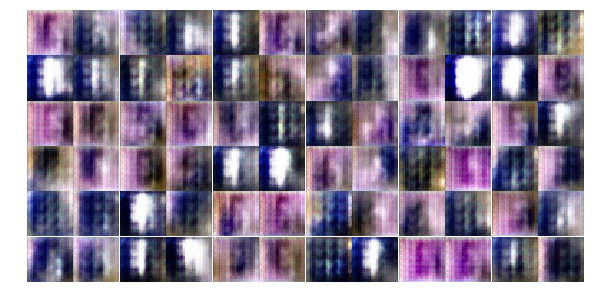

Epoch 1/20... Discriminator Loss: 8.0263... Generator Loss: 10.0272
Epoch 1/20... Discriminator Loss: 0.0020... Generator Loss: 33.1444
Epoch 1/20... Discriminator Loss: 3.5482... Generator Loss: 22.2775
Epoch 1/20... Discriminator Loss: 1.2163... Generator Loss: 32.2402
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 39.1245
Epoch 1/20... Discriminator Loss: 0.4346... Generator Loss: 22.3634
Epoch 1/20... Discriminator Loss: 0.4162... Generator Loss: 49.0528
Epoch 1/20... Discriminator Loss: 2.9468... Generator Loss: 18.8850
Epoch 1/20... Discriminator Loss: 0.7978... Generator Loss: 53.0009
Epoch 1/20... Discriminator Loss: 0.0950... Generator Loss: 20.5681


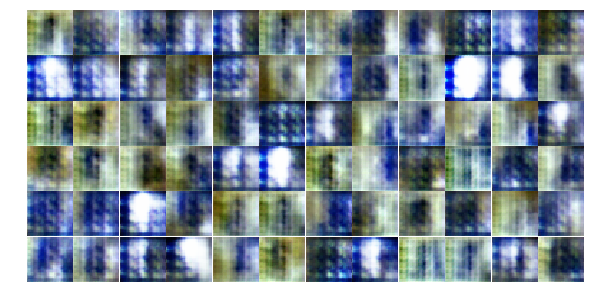

Epoch 1/20... Discriminator Loss: 15.8784... Generator Loss: 9.0792
Epoch 1/20... Discriminator Loss: 9.2628... Generator Loss: 9.0012
Epoch 1/20... Discriminator Loss: 3.4278... Generator Loss: 10.0271
Epoch 1/20... Discriminator Loss: 1.5808... Generator Loss: 25.2634
Epoch 1/20... Discriminator Loss: 0.8532... Generator Loss: 16.6611
Epoch 1/20... Discriminator Loss: 1.3725... Generator Loss: 13.7921
Epoch 1/20... Discriminator Loss: 2.1508... Generator Loss: 6.3973
Epoch 1/20... Discriminator Loss: 0.2664... Generator Loss: 35.7987
Epoch 1/20... Discriminator Loss: 1.1656... Generator Loss: 15.1297
Epoch 1/20... Discriminator Loss: 0.0192... Generator Loss: 34.7303


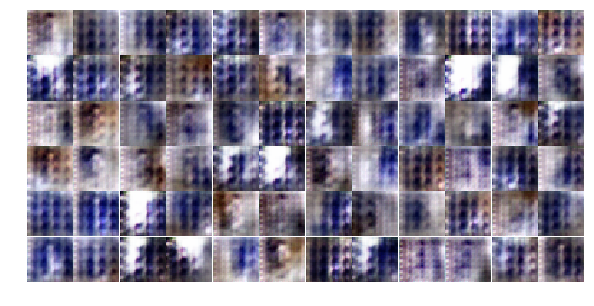

Epoch 1/20... Discriminator Loss: 0.6787... Generator Loss: 37.4266
Epoch 1/20... Discriminator Loss: 2.4869... Generator Loss: 38.4622
Epoch 1/20... Discriminator Loss: 6.8513... Generator Loss: 16.0907
Epoch 1/20... Discriminator Loss: 5.1801... Generator Loss: 10.1704
Epoch 1/20... Discriminator Loss: 1.6197... Generator Loss: 19.3641
Epoch 1/20... Discriminator Loss: 3.0009... Generator Loss: 21.8550
Epoch 1/20... Discriminator Loss: 0.0057... Generator Loss: 31.0624
Epoch 1/20... Discriminator Loss: 5.0319... Generator Loss: 9.6529
Epoch 1/20... Discriminator Loss: 8.0705... Generator Loss: 22.4701
Epoch 1/20... Discriminator Loss: 8.3545... Generator Loss: 6.7654


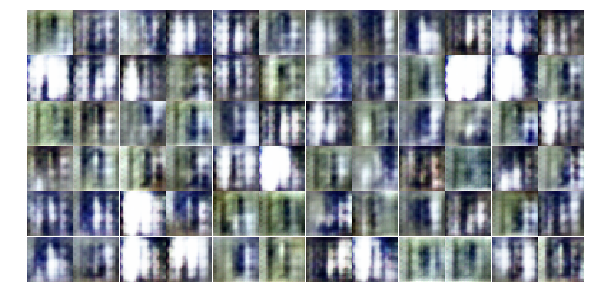

Epoch 1/20... Discriminator Loss: 0.3719... Generator Loss: 29.1087
Epoch 1/20... Discriminator Loss: 0.6822... Generator Loss: 24.8217
Epoch 1/20... Discriminator Loss: 0.0497... Generator Loss: 31.0272
Epoch 1/20... Discriminator Loss: 3.7593... Generator Loss: 10.2651
Epoch 1/20... Discriminator Loss: 0.8000... Generator Loss: 28.0099
Epoch 1/20... Discriminator Loss: 0.4781... Generator Loss: 28.0377
Epoch 1/20... Discriminator Loss: 1.2033... Generator Loss: 31.6898
Epoch 1/20... Discriminator Loss: 4.8947... Generator Loss: 13.0853
Epoch 1/20... Discriminator Loss: 1.7421... Generator Loss: 29.2372
Epoch 1/20... Discriminator Loss: 4.7818... Generator Loss: 15.5730


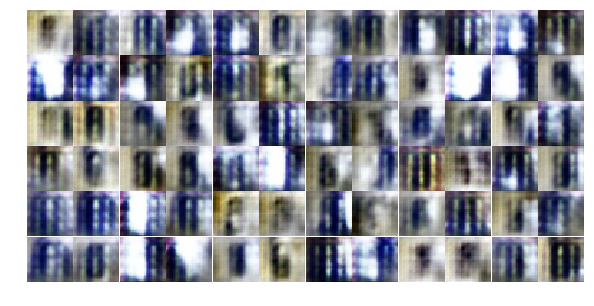

Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 52.2434
Epoch 1/20... Discriminator Loss: 8.2999... Generator Loss: 7.3615
Epoch 1/20... Discriminator Loss: 0.7837... Generator Loss: 39.7833
Epoch 1/20... Discriminator Loss: 0.2724... Generator Loss: 19.0847
Epoch 1/20... Discriminator Loss: 0.1120... Generator Loss: 29.9961
Epoch 1/20... Discriminator Loss: 0.1682... Generator Loss: 24.4293
Epoch 1/20... Discriminator Loss: 0.2331... Generator Loss: 10.2310
Epoch 1/20... Discriminator Loss: 0.0431... Generator Loss: 39.8249
Epoch 1/20... Discriminator Loss: 0.0003... Generator Loss: 52.3518
Epoch 1/20... Discriminator Loss: 7.0901... Generator Loss: 4.8940


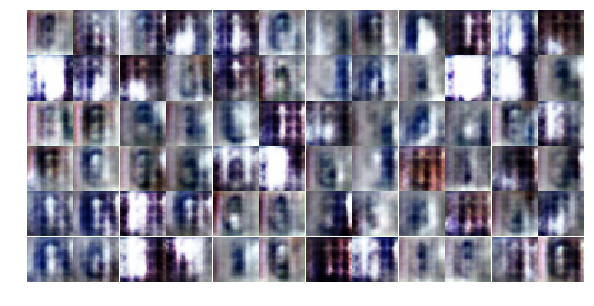

Epoch 1/20... Discriminator Loss: 2.3958... Generator Loss: 10.6249
Epoch 1/20... Discriminator Loss: 2.1668... Generator Loss: 27.9770
Epoch 1/20... Discriminator Loss: 4.9097... Generator Loss: 27.9047
Epoch 1/20... Discriminator Loss: 1.7561... Generator Loss: 10.3399
Epoch 1/20... Discriminator Loss: 2.0921... Generator Loss: 21.4207
Epoch 1/20... Discriminator Loss: 3.8128... Generator Loss: 12.7153
Epoch 1/20... Discriminator Loss: 2.6650... Generator Loss: 11.0902
Epoch 1/20... Discriminator Loss: 1.9950... Generator Loss: 12.3766
Epoch 1/20... Discriminator Loss: 2.8398... Generator Loss: 16.7070
Epoch 1/20... Discriminator Loss: 0.2877... Generator Loss: 35.9515


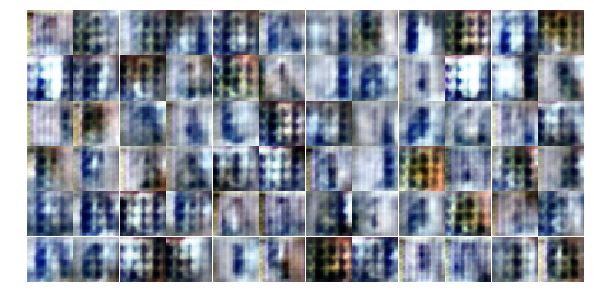

Epoch 1/20... Discriminator Loss: 0.0025... Generator Loss: 23.8276
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 46.1827
Epoch 1/20... Discriminator Loss: 3.5278... Generator Loss: 10.0547
Epoch 1/20... Discriminator Loss: 12.7265... Generator Loss: 5.2022
Epoch 1/20... Discriminator Loss: 9.6062... Generator Loss: 0.8012
Epoch 1/20... Discriminator Loss: 7.0518... Generator Loss: 3.3848
Epoch 1/20... Discriminator Loss: 0.9613... Generator Loss: 12.1761
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 54.5518
Epoch 1/20... Discriminator Loss: 0.1258... Generator Loss: 23.4299
Epoch 1/20... Discriminator Loss: 13.0480... Generator Loss: 7.9427


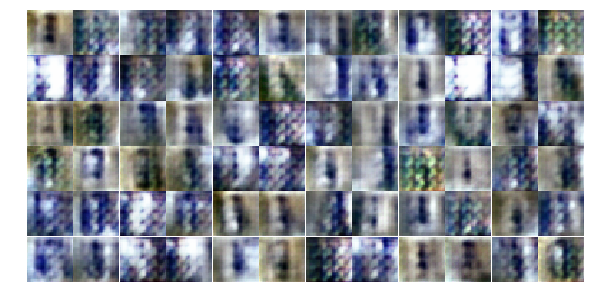

Epoch 1/20... Discriminator Loss: 0.8004... Generator Loss: 21.2773
Epoch 1/20... Discriminator Loss: 2.6485... Generator Loss: 19.0081
Epoch 1/20... Discriminator Loss: 4.3965... Generator Loss: 5.1735
Epoch 1/20... Discriminator Loss: 2.5778... Generator Loss: 9.2064
Epoch 1/20... Discriminator Loss: 0.0289... Generator Loss: 18.3066
Epoch 1/20... Discriminator Loss: 4.8540... Generator Loss: 6.0257
Epoch 1/20... Discriminator Loss: 0.7748... Generator Loss: 18.7386
Epoch 1/20... Discriminator Loss: 14.2057... Generator Loss: 6.4331
Epoch 1/20... Discriminator Loss: 3.1223... Generator Loss: 10.7310
Epoch 1/20... Discriminator Loss: 0.4955... Generator Loss: 27.7526


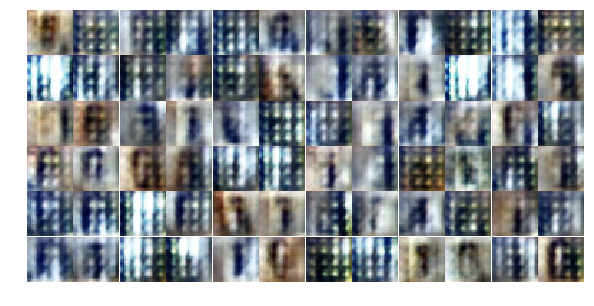

Epoch 1/20... Discriminator Loss: 4.0438... Generator Loss: 21.5957
Epoch 1/20... Discriminator Loss: 0.7010... Generator Loss: 17.1216
Epoch 1/20... Discriminator Loss: 1.0759... Generator Loss: 37.9198
Epoch 1/20... Discriminator Loss: 0.0101... Generator Loss: 18.4693
Epoch 1/20... Discriminator Loss: 1.3008... Generator Loss: 19.5767
Epoch 1/20... Discriminator Loss: 5.9336... Generator Loss: 18.7268
Epoch 1/20... Discriminator Loss: 0.6969... Generator Loss: 44.3132
Epoch 1/20... Discriminator Loss: 3.4862... Generator Loss: 14.5004
Epoch 1/20... Discriminator Loss: 8.0241... Generator Loss: 10.8453
Epoch 1/20... Discriminator Loss: 4.6642... Generator Loss: 9.8562


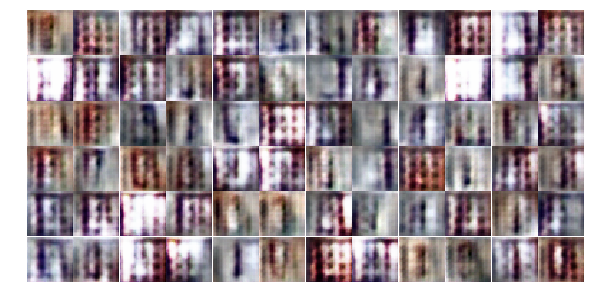

Epoch 1/20... Discriminator Loss: 0.4941... Generator Loss: 11.3066
Epoch 1/20... Discriminator Loss: 0.1252... Generator Loss: 23.2753
Epoch 1/20... Discriminator Loss: 1.2516... Generator Loss: 13.6486
Epoch 1/20... Discriminator Loss: 0.0517... Generator Loss: 19.5738
Epoch 1/20... Discriminator Loss: 5.5060... Generator Loss: 29.2553
Epoch 1/20... Discriminator Loss: 1.0580... Generator Loss: 24.1690
Epoch 1/20... Discriminator Loss: 0.8246... Generator Loss: 19.3691
Epoch 1/20... Discriminator Loss: 0.8320... Generator Loss: 14.6687
Epoch 1/20... Discriminator Loss: 0.6324... Generator Loss: 17.0554
Epoch 1/20... Discriminator Loss: 0.0006... Generator Loss: 21.9313


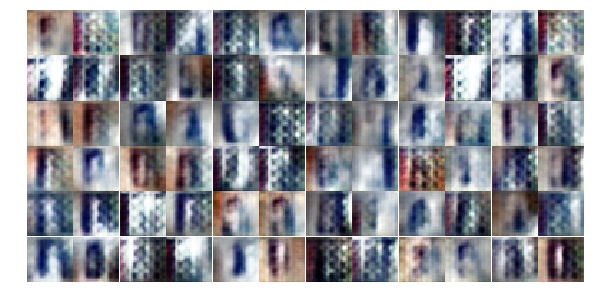

Epoch 1/20... Discriminator Loss: 0.3168... Generator Loss: 24.6104
Epoch 1/20... Discriminator Loss: 0.5621... Generator Loss: 22.3633
Epoch 1/20... Discriminator Loss: 0.0975... Generator Loss: 23.9054
Epoch 1/20... Discriminator Loss: 3.6866... Generator Loss: 22.5501
Epoch 1/20... Discriminator Loss: 0.0003... Generator Loss: 33.8029
Epoch 1/20... Discriminator Loss: 12.5776... Generator Loss: 2.6254
Epoch 1/20... Discriminator Loss: 4.1740... Generator Loss: 7.7959
Epoch 1/20... Discriminator Loss: 0.7972... Generator Loss: 20.0580
Epoch 1/20... Discriminator Loss: 7.3788... Generator Loss: 8.8992
Epoch 1/20... Discriminator Loss: 6.8688... Generator Loss: 8.3797


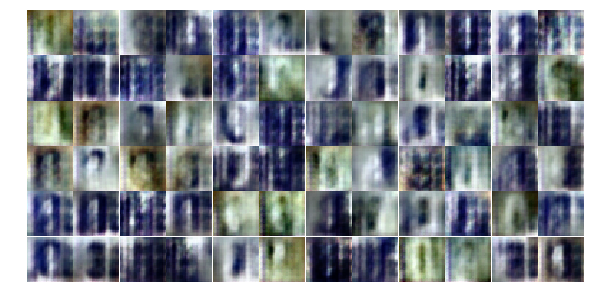

Epoch 1/20... Discriminator Loss: 0.8807... Generator Loss: 33.6754
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 44.7654
Epoch 1/20... Discriminator Loss: 9.9989... Generator Loss: 9.1445
Epoch 1/20... Discriminator Loss: 0.0372... Generator Loss: 24.7635
Epoch 1/20... Discriminator Loss: 4.4443... Generator Loss: 10.9349
Epoch 1/20... Discriminator Loss: 0.5146... Generator Loss: 14.4480
Epoch 1/20... Discriminator Loss: 10.2620... Generator Loss: 5.2980
Epoch 1/20... Discriminator Loss: 0.2300... Generator Loss: 25.3070
Epoch 1/20... Discriminator Loss: 0.0022... Generator Loss: 48.0023
Epoch 1/20... Discriminator Loss: 0.8659... Generator Loss: 23.6270


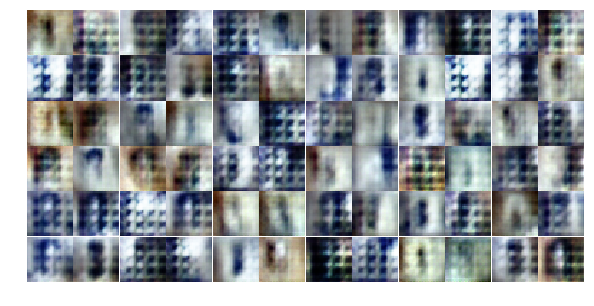

Epoch 1/20... Discriminator Loss: 0.0837... Generator Loss: 25.0667
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 45.5821
Epoch 1/20... Discriminator Loss: 0.0002... Generator Loss: 20.4319
Epoch 1/20... Discriminator Loss: 1.3366... Generator Loss: 34.0185
Epoch 1/20... Discriminator Loss: 0.4183... Generator Loss: 33.3330
Epoch 1/20... Discriminator Loss: 2.2598... Generator Loss: 27.3810
Epoch 1/20... Discriminator Loss: 0.9216... Generator Loss: 15.6461
Epoch 1/20... Discriminator Loss: 2.4361... Generator Loss: 7.4075
Epoch 1/20... Discriminator Loss: 3.4160... Generator Loss: 9.8354
Epoch 1/20... Discriminator Loss: 2.6765... Generator Loss: 18.8920


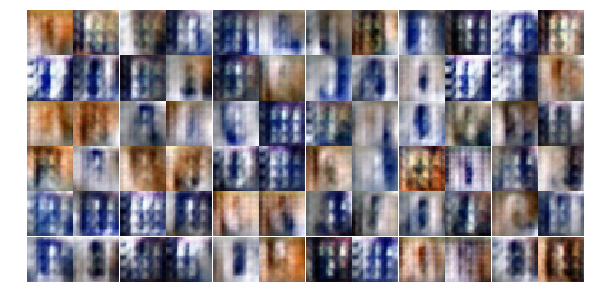

Epoch 1/20... Discriminator Loss: 0.7278... Generator Loss: 21.7502
Epoch 1/20... Discriminator Loss: 0.7334... Generator Loss: 20.6541
Epoch 1/20... Discriminator Loss: 0.7333... Generator Loss: 40.1864
Epoch 1/20... Discriminator Loss: 5.8004... Generator Loss: 23.5691
Epoch 1/20... Discriminator Loss: 2.7667... Generator Loss: 8.5341
Epoch 1/20... Discriminator Loss: 0.0093... Generator Loss: 31.1503
Epoch 1/20... Discriminator Loss: 5.0933... Generator Loss: 26.5258
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 49.7985
Epoch 1/20... Discriminator Loss: 0.1941... Generator Loss: 22.3435
Epoch 1/20... Discriminator Loss: 0.3425... Generator Loss: 30.1239


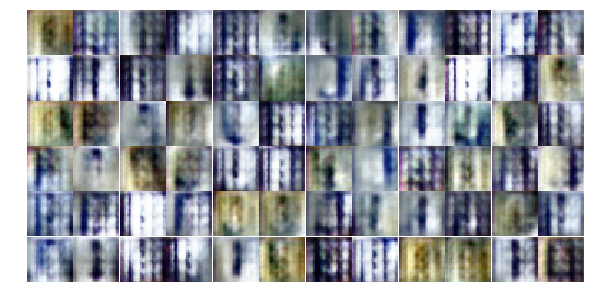

Epoch 1/20... Discriminator Loss: 0.0018... Generator Loss: 30.0109
Epoch 1/20... Discriminator Loss: 13.5992... Generator Loss: 2.0834
Epoch 1/20... Discriminator Loss: 0.9198... Generator Loss: 25.8513
Epoch 1/20... Discriminator Loss: 0.4290... Generator Loss: 39.2743
Epoch 1/20... Discriminator Loss: 2.5293... Generator Loss: 13.2381
Epoch 1/20... Discriminator Loss: 2.8580... Generator Loss: 16.2847
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 26.5871
Epoch 1/20... Discriminator Loss: 0.4661... Generator Loss: 36.5089
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 55.6635
Epoch 1/20... Discriminator Loss: 0.6783... Generator Loss: 17.2554


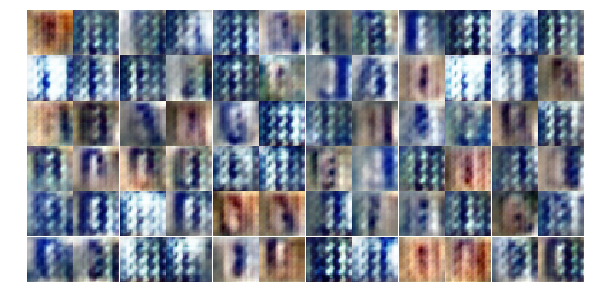

Epoch 1/20... Discriminator Loss: 0.0002... Generator Loss: 41.0269
Epoch 1/20... Discriminator Loss: 3.3458... Generator Loss: 17.8990
Epoch 1/20... Discriminator Loss: 2.8771... Generator Loss: 10.0109
Epoch 1/20... Discriminator Loss: 0.0667... Generator Loss: 32.4122
Epoch 1/20... Discriminator Loss: 6.5190... Generator Loss: 9.4722
Epoch 1/20... Discriminator Loss: 0.3572... Generator Loss: 30.5551
Epoch 1/20... Discriminator Loss: 0.0004... Generator Loss: 37.2684
Epoch 1/20... Discriminator Loss: 7.5929... Generator Loss: 0.9645
Epoch 1/20... Discriminator Loss: 5.5210... Generator Loss: 8.2755
Epoch 1/20... Discriminator Loss: 0.0047... Generator Loss: 32.3986


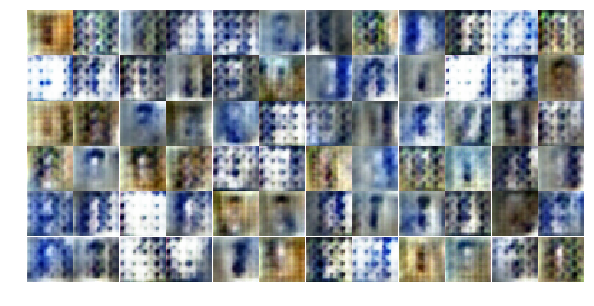

Epoch 1/20... Discriminator Loss: 3.4817... Generator Loss: 15.4509
Epoch 1/20... Discriminator Loss: 2.2618... Generator Loss: 17.6340
Epoch 1/20... Discriminator Loss: 0.1783... Generator Loss: 21.1046
Epoch 1/20... Discriminator Loss: 0.4538... Generator Loss: 16.0951
Epoch 1/20... Discriminator Loss: 1.1873... Generator Loss: 13.8250
Epoch 1/20... Discriminator Loss: 2.8176... Generator Loss: 16.1244
Epoch 1/20... Discriminator Loss: 0.4409... Generator Loss: 39.8647
Epoch 1/20... Discriminator Loss: 4.1662... Generator Loss: 12.4797
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 40.3809
Epoch 1/20... Discriminator Loss: 0.0030... Generator Loss: 38.2829


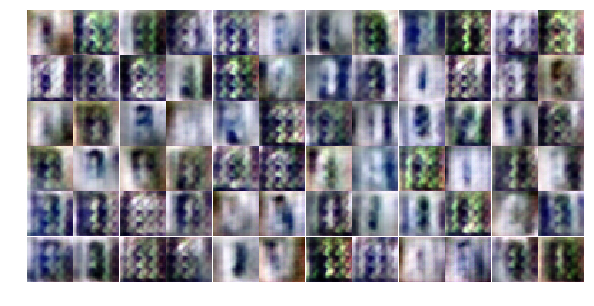

Epoch 1/20... Discriminator Loss: 2.3472... Generator Loss: 10.5536
Epoch 1/20... Discriminator Loss: 12.4732... Generator Loss: 0.1826
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 30.5403
Epoch 1/20... Discriminator Loss: 0.0565... Generator Loss: 24.4153
Epoch 1/20... Discriminator Loss: 0.3135... Generator Loss: 22.8183
Epoch 1/20... Discriminator Loss: 0.0645... Generator Loss: 25.7666
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 38.9707
Epoch 1/20... Discriminator Loss: 0.6240... Generator Loss: 18.9115
Epoch 1/20... Discriminator Loss: 0.0005... Generator Loss: 31.0626
Epoch 1/20... Discriminator Loss: 0.2343... Generator Loss: 44.2208


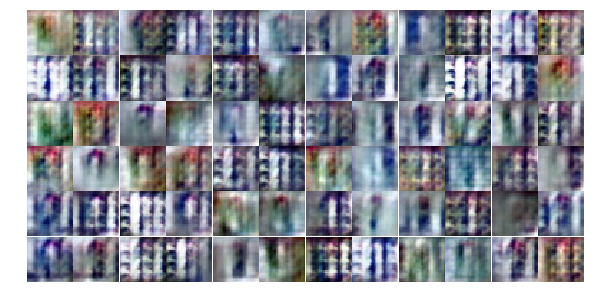

Epoch 1/20... Discriminator Loss: 4.6336... Generator Loss: 14.7243
Epoch 1/20... Discriminator Loss: 9.5185... Generator Loss: 34.7584
Epoch 1/20... Discriminator Loss: 0.0009... Generator Loss: 24.9045
Epoch 1/20... Discriminator Loss: 2.0141... Generator Loss: 25.6062
Epoch 1/20... Discriminator Loss: 0.1170... Generator Loss: 31.0357
Epoch 1/20... Discriminator Loss: 0.5487... Generator Loss: 37.5741
Epoch 1/20... Discriminator Loss: 0.4194... Generator Loss: 24.0910
Epoch 1/20... Discriminator Loss: 0.0018... Generator Loss: 30.4099
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 47.5057
Epoch 1/20... Discriminator Loss: 0.7744... Generator Loss: 28.4103


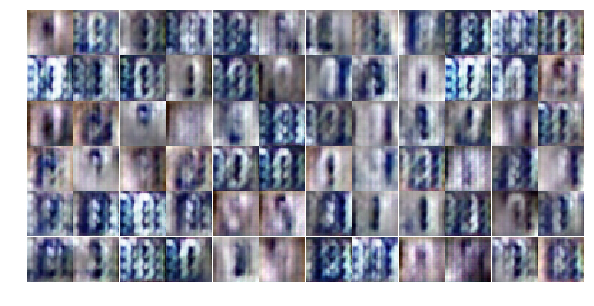

Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 27.3109
Epoch 1/20... Discriminator Loss: 0.0006... Generator Loss: 35.6415
Epoch 1/20... Discriminator Loss: 0.0123... Generator Loss: 37.7223
Epoch 1/20... Discriminator Loss: 0.0001... Generator Loss: 34.3121
Epoch 1/20... Discriminator Loss: 1.4271... Generator Loss: 23.9928
Epoch 1/20... Discriminator Loss: 1.5329... Generator Loss: 13.2286
Epoch 1/20... Discriminator Loss: 0.0099... Generator Loss: 21.8881
Epoch 1/20... Discriminator Loss: 5.5175... Generator Loss: 15.6118
Epoch 1/20... Discriminator Loss: 0.0114... Generator Loss: 36.3185
Epoch 1/20... Discriminator Loss: 1.3838... Generator Loss: 9.3268


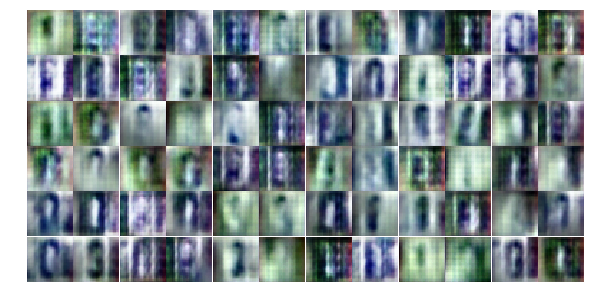

Epoch 1/20... Discriminator Loss: 2.9630... Generator Loss: 12.7372
Epoch 1/20... Discriminator Loss: 0.7309... Generator Loss: 8.2766
Epoch 1/20... Discriminator Loss: 2.3258... Generator Loss: 20.6285
Epoch 1/20... Discriminator Loss: 4.9940... Generator Loss: 5.9831
Epoch 1/20... Discriminator Loss: 0.9860... Generator Loss: 15.1153
Epoch 1/20... Discriminator Loss: 0.0007... Generator Loss: 19.5454
Epoch 1/20... Discriminator Loss: 0.9435... Generator Loss: 18.3583
Epoch 1/20... Discriminator Loss: 2.4416... Generator Loss: 20.2900
Epoch 1/20... Discriminator Loss: 3.2061... Generator Loss: 31.8986
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 31.3622


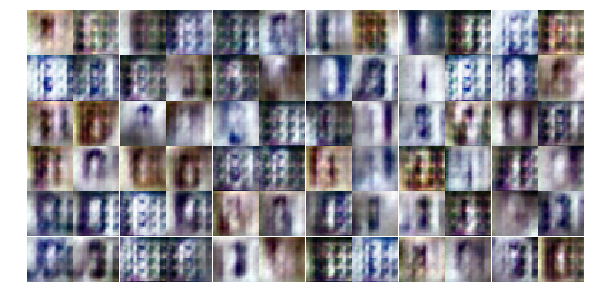

Epoch 1/20... Discriminator Loss: 1.6030... Generator Loss: 15.7414
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 56.0874
Epoch 1/20... Discriminator Loss: 1.0915... Generator Loss: 24.5622
Epoch 1/20... Discriminator Loss: 8.7429... Generator Loss: 12.6096
Epoch 1/20... Discriminator Loss: 0.1444... Generator Loss: 46.3480
Epoch 1/20... Discriminator Loss: 0.0942... Generator Loss: 31.0778
Epoch 1/20... Discriminator Loss: 2.6805... Generator Loss: 10.3926
Epoch 1/20... Discriminator Loss: 5.3399... Generator Loss: 13.1245
Epoch 1/20... Discriminator Loss: 0.0013... Generator Loss: 30.7490
Epoch 1/20... Discriminator Loss: 2.2429... Generator Loss: 45.9922


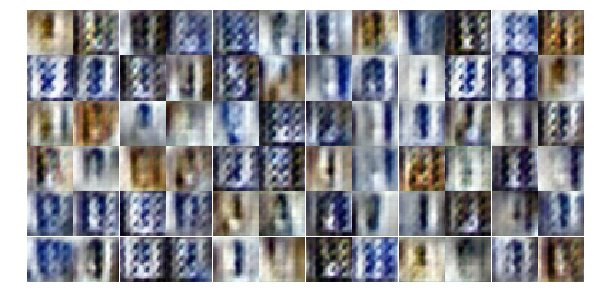

Epoch 1/20... Discriminator Loss: 5.9008... Generator Loss: 29.4921
Epoch 1/20... Discriminator Loss: 0.0078... Generator Loss: 43.7797
Epoch 1/20... Discriminator Loss: 2.3835... Generator Loss: 27.1799
Epoch 1/20... Discriminator Loss: 0.2499... Generator Loss: 26.9843
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 35.4121
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 46.1075
Epoch 1/20... Discriminator Loss: 1.6611... Generator Loss: 42.3104
Epoch 1/20... Discriminator Loss: 2.6304... Generator Loss: 14.1587
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 33.0692
Epoch 1/20... Discriminator Loss: 0.4678... Generator Loss: 20.0384


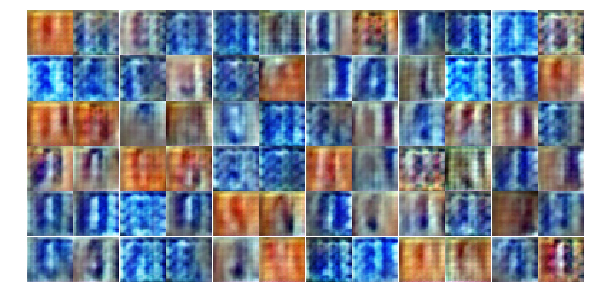

Epoch 1/20... Discriminator Loss: 0.2675... Generator Loss: 31.0407
Epoch 1/20... Discriminator Loss: 2.8354... Generator Loss: 19.8935
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 48.8144
Epoch 1/20... Discriminator Loss: 0.8589... Generator Loss: 9.2116
Epoch 1/20... Discriminator Loss: 16.0000... Generator Loss: 0.1753
Epoch 1/20... Discriminator Loss: 13.7327... Generator Loss: 1.8226
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 57.1774
Epoch 1/20... Discriminator Loss: 0.0005... Generator Loss: 41.7187
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 51.5451
Epoch 1/20... Discriminator Loss: 0.6425... Generator Loss: 21.7114


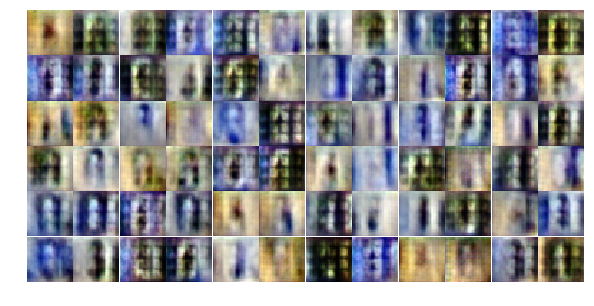

Epoch 1/20... Discriminator Loss: 0.2094... Generator Loss: 19.5249
Epoch 1/20... Discriminator Loss: 0.8849... Generator Loss: 15.2410
Epoch 1/20... Discriminator Loss: 3.3734... Generator Loss: 11.6326
Epoch 1/20... Discriminator Loss: 0.2297... Generator Loss: 22.0584
Epoch 1/20... Discriminator Loss: 3.3639... Generator Loss: 24.0612
Epoch 1/20... Discriminator Loss: 0.8967... Generator Loss: 24.3439
Epoch 1/20... Discriminator Loss: 2.9432... Generator Loss: 12.1042
Epoch 1/20... Discriminator Loss: 4.3362... Generator Loss: 15.8975
Epoch 1/20... Discriminator Loss: 0.0018... Generator Loss: 34.0141
Epoch 1/20... Discriminator Loss: 0.6932... Generator Loss: 24.3968


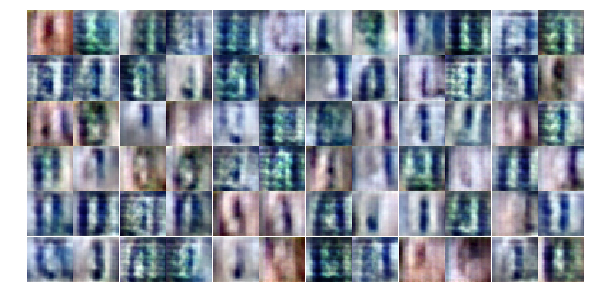

Epoch 1/20... Discriminator Loss: 0.4197... Generator Loss: 30.0043
Epoch 1/20... Discriminator Loss: 0.5574... Generator Loss: 10.4151
Epoch 1/20... Discriminator Loss: 0.5190... Generator Loss: 18.4970
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 43.0635
Epoch 1/20... Discriminator Loss: 0.8446... Generator Loss: 17.8225
Epoch 1/20... Discriminator Loss: 0.0005... Generator Loss: 19.8814
Epoch 1/20... Discriminator Loss: 0.5718... Generator Loss: 17.0680
Epoch 1/20... Discriminator Loss: 0.0709... Generator Loss: 11.4702
Epoch 1/20... Discriminator Loss: 2.1482... Generator Loss: 14.6031
Epoch 1/20... Discriminator Loss: 4.1424... Generator Loss: 4.1421


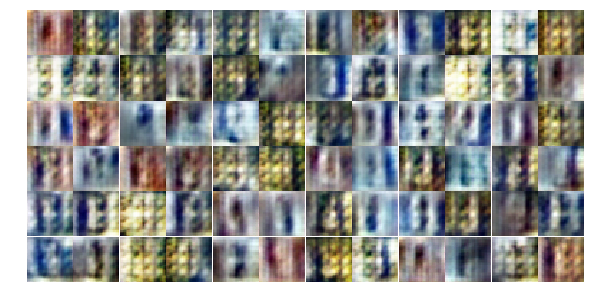

Epoch 1/20... Discriminator Loss: 15.6326... Generator Loss: 1.1174
Epoch 1/20... Discriminator Loss: 0.5787... Generator Loss: 33.9887
Epoch 1/20... Discriminator Loss: 0.0001... Generator Loss: 31.4087
Epoch 1/20... Discriminator Loss: 0.0215... Generator Loss: 20.7362
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 66.1520
Epoch 1/20... Discriminator Loss: 7.5099... Generator Loss: 7.7204
Epoch 1/20... Discriminator Loss: 3.7078... Generator Loss: 20.1042
Epoch 1/20... Discriminator Loss: 7.3910... Generator Loss: 44.7127
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 68.0853
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 31.3945


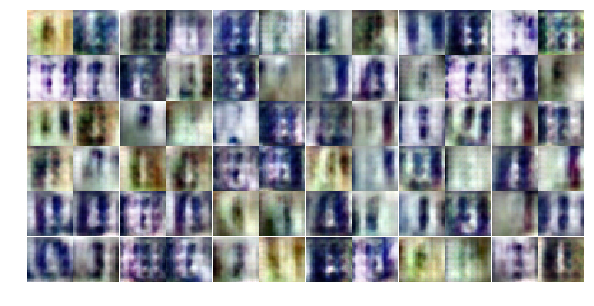

Epoch 1/20... Discriminator Loss: 0.0245... Generator Loss: 43.9600
Epoch 1/20... Discriminator Loss: 0.0047... Generator Loss: 39.4714
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 40.5225
Epoch 1/20... Discriminator Loss: 0.0085... Generator Loss: 29.3276
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 41.2320
Epoch 1/20... Discriminator Loss: 1.3234... Generator Loss: 13.1149
Epoch 1/20... Discriminator Loss: 0.6600... Generator Loss: 12.9852
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 37.1730
Epoch 1/20... Discriminator Loss: 0.0781... Generator Loss: 41.5362
Epoch 1/20... Discriminator Loss: 3.6694... Generator Loss: 6.0784


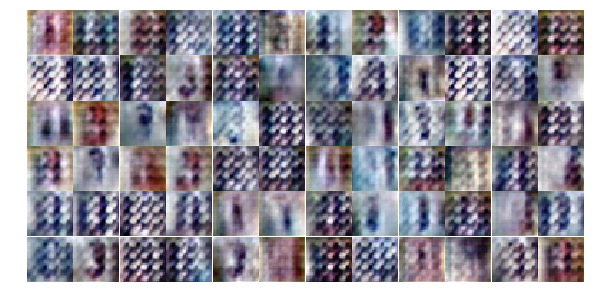

Epoch 1/20... Discriminator Loss: 4.7804... Generator Loss: 14.8310
Epoch 1/20... Discriminator Loss: 0.0377... Generator Loss: 38.6960
Epoch 1/20... Discriminator Loss: 7.5739... Generator Loss: 5.1647
Epoch 1/20... Discriminator Loss: 4.6658... Generator Loss: 6.7415
Epoch 1/20... Discriminator Loss: 0.0296... Generator Loss: 22.2471
Epoch 1/20... Discriminator Loss: 0.0173... Generator Loss: 37.0416
Epoch 1/20... Discriminator Loss: 0.0214... Generator Loss: 39.3698
Epoch 1/20... Discriminator Loss: 0.4988... Generator Loss: 20.7962
Epoch 1/20... Discriminator Loss: 0.2165... Generator Loss: 27.7060
Epoch 1/20... Discriminator Loss: 1.7561... Generator Loss: 16.0347


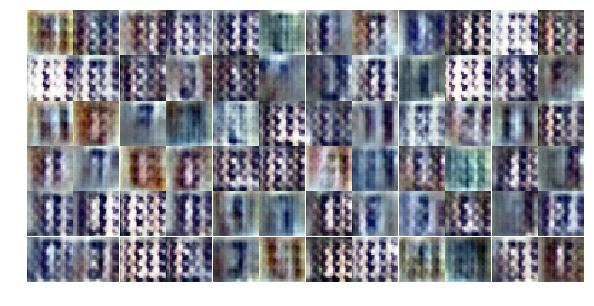

Epoch 1/20... Discriminator Loss: 0.0005... Generator Loss: 32.2201
Epoch 1/20... Discriminator Loss: 0.0066... Generator Loss: 33.0537
Epoch 1/20... Discriminator Loss: 0.0698... Generator Loss: 20.4037
Epoch 1/20... Discriminator Loss: 0.5958... Generator Loss: 30.0815
Epoch 1/20... Discriminator Loss: 0.8680... Generator Loss: 31.6804
Epoch 1/20... Discriminator Loss: 0.0563... Generator Loss: 35.4583
Epoch 1/20... Discriminator Loss: 3.2602... Generator Loss: 6.7678
Epoch 1/20... Discriminator Loss: 0.2463... Generator Loss: 47.7638
Epoch 1/20... Discriminator Loss: 0.3942... Generator Loss: 19.6601
Epoch 1/20... Discriminator Loss: 0.3636... Generator Loss: 28.2954


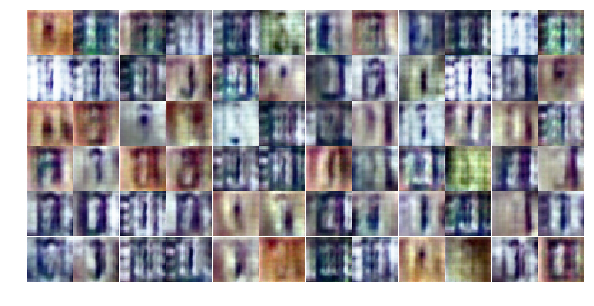

Epoch 1/20... Discriminator Loss: 15.1225... Generator Loss: 10.4367
Epoch 1/20... Discriminator Loss: 0.3403... Generator Loss: 22.7546
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 31.9267
Epoch 1/20... Discriminator Loss: 3.1733... Generator Loss: 23.6078
Epoch 1/20... Discriminator Loss: 0.5365... Generator Loss: 13.9998
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 47.4172
Epoch 1/20... Discriminator Loss: 0.0000... Generator Loss: 42.0591
Epoch 2/20... Discriminator Loss: 0.0578... Generator Loss: 29.5582
Epoch 2/20... Discriminator Loss: 0.0237... Generator Loss: 23.5258
Epoch 2/20... Discriminator Loss: 7.8480... Generator Loss: 2.9193


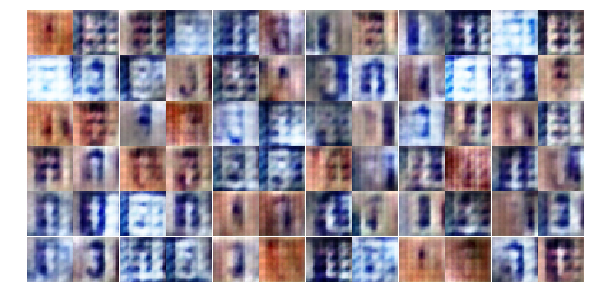

Epoch 2/20... Discriminator Loss: 3.7205... Generator Loss: 12.9978
Epoch 2/20... Discriminator Loss: 0.8165... Generator Loss: 23.6918
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 33.8572
Epoch 2/20... Discriminator Loss: 7.5303... Generator Loss: 2.1444
Epoch 2/20... Discriminator Loss: 7.7247... Generator Loss: 8.2375
Epoch 2/20... Discriminator Loss: 14.6363... Generator Loss: 22.2941
Epoch 2/20... Discriminator Loss: 0.0132... Generator Loss: 46.2373
Epoch 2/20... Discriminator Loss: 0.0004... Generator Loss: 36.6964
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 43.1846
Epoch 2/20... Discriminator Loss: 1.5390... Generator Loss: 28.1531


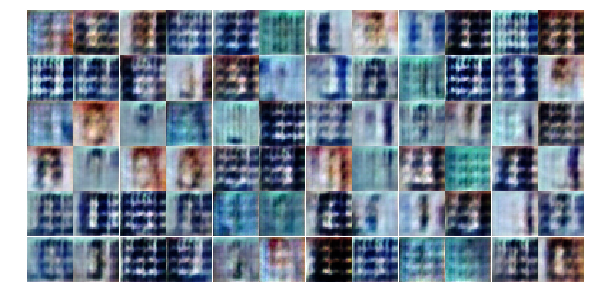

Epoch 2/20... Discriminator Loss: 3.2963... Generator Loss: 10.0078
Epoch 2/20... Discriminator Loss: 1.2288... Generator Loss: 27.3543
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 39.0878
Epoch 2/20... Discriminator Loss: 0.4554... Generator Loss: 28.0848
Epoch 2/20... Discriminator Loss: 0.3305... Generator Loss: 25.6183
Epoch 2/20... Discriminator Loss: 0.7652... Generator Loss: 17.1589
Epoch 2/20... Discriminator Loss: 3.0786... Generator Loss: 13.9503
Epoch 2/20... Discriminator Loss: 0.0001... Generator Loss: 31.7294
Epoch 2/20... Discriminator Loss: 6.7342... Generator Loss: 20.2861
Epoch 2/20... Discriminator Loss: 0.1814... Generator Loss: 21.4952


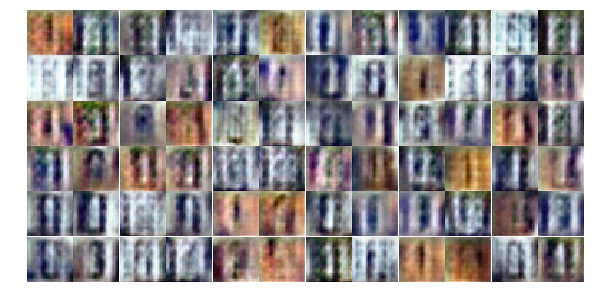

Epoch 2/20... Discriminator Loss: 2.9622... Generator Loss: 15.4232
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 37.5642
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 36.5842
Epoch 2/20... Discriminator Loss: 1.5783... Generator Loss: 17.8801
Epoch 2/20... Discriminator Loss: 0.0577... Generator Loss: 20.5123
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 37.2556
Epoch 2/20... Discriminator Loss: 10.9251... Generator Loss: 54.6531
Epoch 2/20... Discriminator Loss: 2.7910... Generator Loss: 11.6908
Epoch 2/20... Discriminator Loss: 0.9656... Generator Loss: 17.4320
Epoch 2/20... Discriminator Loss: 0.0023... Generator Loss: 25.3515


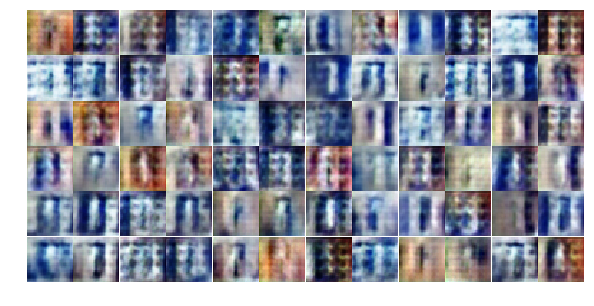

Epoch 2/20... Discriminator Loss: 2.3064... Generator Loss: 7.5876
Epoch 2/20... Discriminator Loss: 0.0728... Generator Loss: 21.1521
Epoch 2/20... Discriminator Loss: 0.1726... Generator Loss: 19.3955
Epoch 2/20... Discriminator Loss: 8.6784... Generator Loss: 52.4612
Epoch 2/20... Discriminator Loss: 0.3935... Generator Loss: 22.4560
Epoch 2/20... Discriminator Loss: 0.2571... Generator Loss: 22.9000
Epoch 2/20... Discriminator Loss: 0.0002... Generator Loss: 29.0114
Epoch 2/20... Discriminator Loss: 2.5133... Generator Loss: 27.7854
Epoch 2/20... Discriminator Loss: 3.3873... Generator Loss: 14.1895
Epoch 2/20... Discriminator Loss: 0.4100... Generator Loss: 23.9480


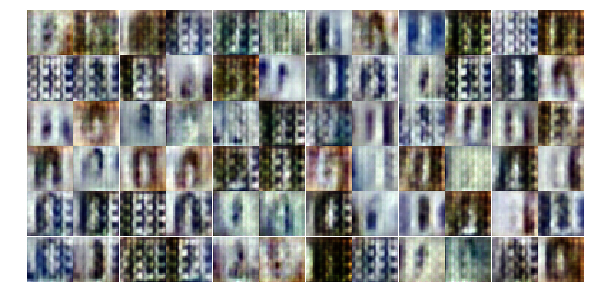

Epoch 2/20... Discriminator Loss: 0.1130... Generator Loss: 13.7460
Epoch 2/20... Discriminator Loss: 0.5828... Generator Loss: 11.0417
Epoch 2/20... Discriminator Loss: 2.7196... Generator Loss: 8.8316
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 42.5452
Epoch 2/20... Discriminator Loss: 5.3141... Generator Loss: 14.8135
Epoch 2/20... Discriminator Loss: 0.0508... Generator Loss: 30.3194
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 46.1397
Epoch 2/20... Discriminator Loss: 2.5174... Generator Loss: 24.3230
Epoch 2/20... Discriminator Loss: 0.0390... Generator Loss: 24.8332
Epoch 2/20... Discriminator Loss: 0.8794... Generator Loss: 57.2473


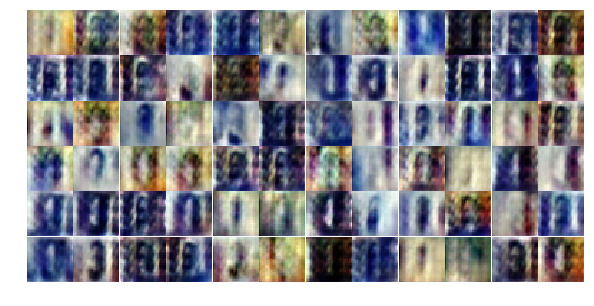

Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 53.5669
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 71.5827
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 48.7974
Epoch 2/20... Discriminator Loss: 2.1972... Generator Loss: 20.9094
Epoch 2/20... Discriminator Loss: 18.2897... Generator Loss: 4.0833
Epoch 2/20... Discriminator Loss: 2.4151... Generator Loss: 12.2712
Epoch 2/20... Discriminator Loss: 0.1436... Generator Loss: 28.6823
Epoch 2/20... Discriminator Loss: 0.0014... Generator Loss: 21.2926
Epoch 2/20... Discriminator Loss: 1.3867... Generator Loss: 22.0900
Epoch 2/20... Discriminator Loss: 0.3445... Generator Loss: 15.6566


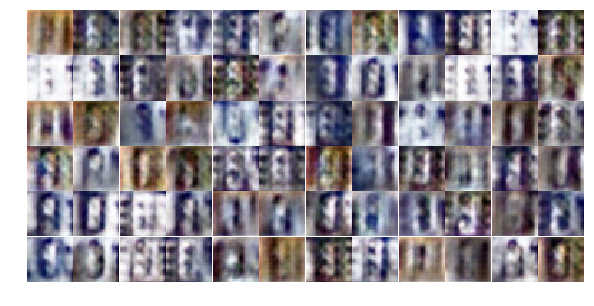

Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 40.3703
Epoch 2/20... Discriminator Loss: 2.8003... Generator Loss: 12.1809
Epoch 2/20... Discriminator Loss: 0.0001... Generator Loss: 26.9499
Epoch 2/20... Discriminator Loss: 7.0863... Generator Loss: 10.5429
Epoch 2/20... Discriminator Loss: 0.1340... Generator Loss: 25.4005
Epoch 2/20... Discriminator Loss: 0.0004... Generator Loss: 25.7198
Epoch 2/20... Discriminator Loss: 2.7315... Generator Loss: 18.7345
Epoch 2/20... Discriminator Loss: 9.4490... Generator Loss: 4.5629
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 41.7336
Epoch 2/20... Discriminator Loss: 0.0007... Generator Loss: 39.4505


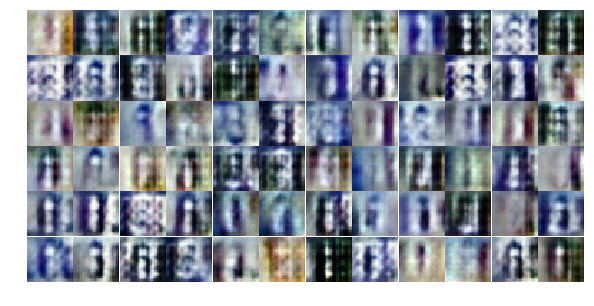

Epoch 2/20... Discriminator Loss: 0.4390... Generator Loss: 31.7774
Epoch 2/20... Discriminator Loss: 1.3456... Generator Loss: 24.5343
Epoch 2/20... Discriminator Loss: 1.6803... Generator Loss: 12.1608
Epoch 2/20... Discriminator Loss: 10.3489... Generator Loss: 4.7313
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 31.2418
Epoch 2/20... Discriminator Loss: 0.9712... Generator Loss: 25.2919
Epoch 2/20... Discriminator Loss: 2.4173... Generator Loss: 20.6647
Epoch 2/20... Discriminator Loss: 3.4190... Generator Loss: 10.2837
Epoch 2/20... Discriminator Loss: 0.1923... Generator Loss: 38.9716
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 33.4905


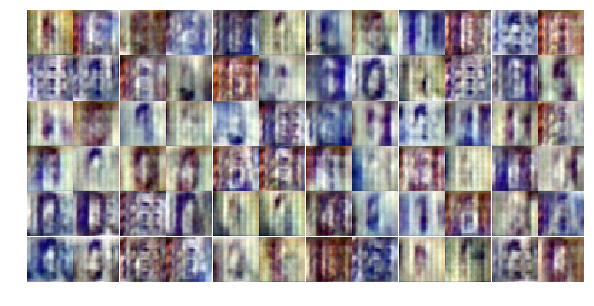

Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 40.6253
Epoch 2/20... Discriminator Loss: 12.9268... Generator Loss: 4.1980
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 38.5708
Epoch 2/20... Discriminator Loss: 0.0096... Generator Loss: 29.6173
Epoch 2/20... Discriminator Loss: 0.6472... Generator Loss: 21.1874
Epoch 2/20... Discriminator Loss: 1.3595... Generator Loss: 25.5437
Epoch 2/20... Discriminator Loss: 0.5396... Generator Loss: 15.5080
Epoch 2/20... Discriminator Loss: 0.1336... Generator Loss: 24.9563
Epoch 2/20... Discriminator Loss: 0.3195... Generator Loss: 45.3769
Epoch 2/20... Discriminator Loss: 0.0018... Generator Loss: 22.0776


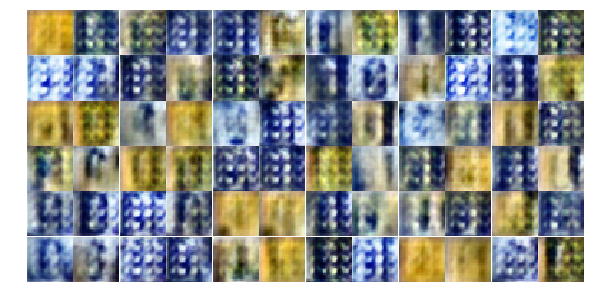

Epoch 2/20... Discriminator Loss: 0.0001... Generator Loss: 30.8705
Epoch 2/20... Discriminator Loss: 1.0680... Generator Loss: 31.0212
Epoch 2/20... Discriminator Loss: 4.2162... Generator Loss: 9.9235
Epoch 2/20... Discriminator Loss: 0.0001... Generator Loss: 28.8266
Epoch 2/20... Discriminator Loss: 2.6151... Generator Loss: 27.5212
Epoch 2/20... Discriminator Loss: 0.0001... Generator Loss: 39.7423
Epoch 2/20... Discriminator Loss: 0.3806... Generator Loss: 17.5416
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 43.0860
Epoch 2/20... Discriminator Loss: 0.0002... Generator Loss: 36.8059
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 32.7213


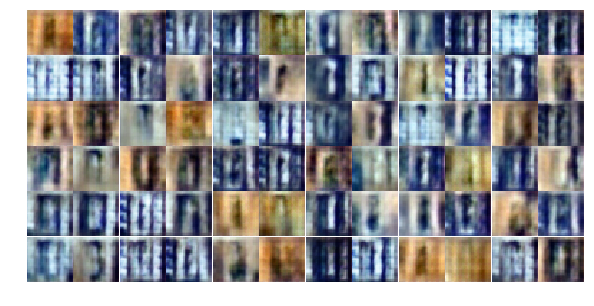

Epoch 2/20... Discriminator Loss: 1.2425... Generator Loss: 43.2670
Epoch 2/20... Discriminator Loss: 0.0003... Generator Loss: 30.0176
Epoch 2/20... Discriminator Loss: 0.0014... Generator Loss: 29.4260
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 34.5732
Epoch 2/20... Discriminator Loss: 8.8704... Generator Loss: 9.3902
Epoch 2/20... Discriminator Loss: 0.2279... Generator Loss: 22.1233
Epoch 2/20... Discriminator Loss: 0.0008... Generator Loss: 44.9625
Epoch 2/20... Discriminator Loss: 5.7481... Generator Loss: 14.5051
Epoch 2/20... Discriminator Loss: 1.5060... Generator Loss: 12.9024
Epoch 2/20... Discriminator Loss: 10.5038... Generator Loss: 13.2991


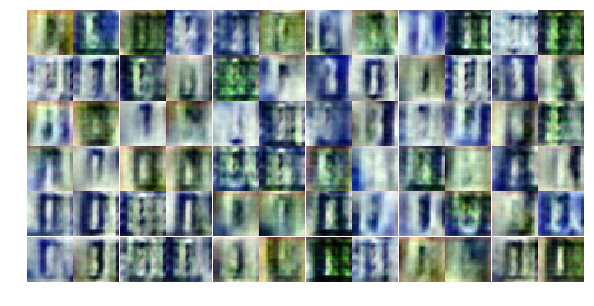

Epoch 2/20... Discriminator Loss: 1.0524... Generator Loss: 29.0394
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 35.2358
Epoch 2/20... Discriminator Loss: 0.4797... Generator Loss: 43.0773
Epoch 2/20... Discriminator Loss: 1.3470... Generator Loss: 30.2764
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 60.3954
Epoch 2/20... Discriminator Loss: 1.2331... Generator Loss: 29.2529
Epoch 2/20... Discriminator Loss: 0.1820... Generator Loss: 26.4683
Epoch 2/20... Discriminator Loss: 6.5610... Generator Loss: 10.0192
Epoch 2/20... Discriminator Loss: 29.0304... Generator Loss: 2.8930
Epoch 2/20... Discriminator Loss: 1.3508... Generator Loss: 17.8532


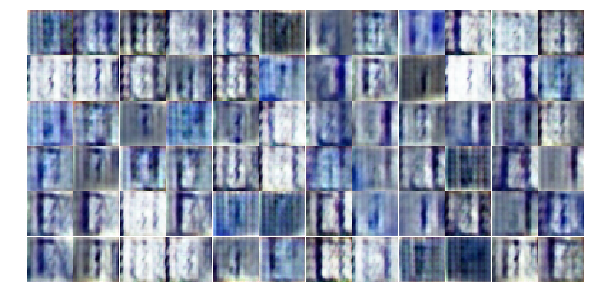

Epoch 2/20... Discriminator Loss: 0.2164... Generator Loss: 19.9200
Epoch 2/20... Discriminator Loss: 1.2105... Generator Loss: 11.9638
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 40.8785
Epoch 2/20... Discriminator Loss: 0.0031... Generator Loss: 32.3115
Epoch 2/20... Discriminator Loss: 0.0809... Generator Loss: 16.4971
Epoch 2/20... Discriminator Loss: 1.7795... Generator Loss: 5.0261
Epoch 2/20... Discriminator Loss: 1.9836... Generator Loss: 6.9763
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 52.2837
Epoch 2/20... Discriminator Loss: 5.2170... Generator Loss: 7.8908
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 35.6817


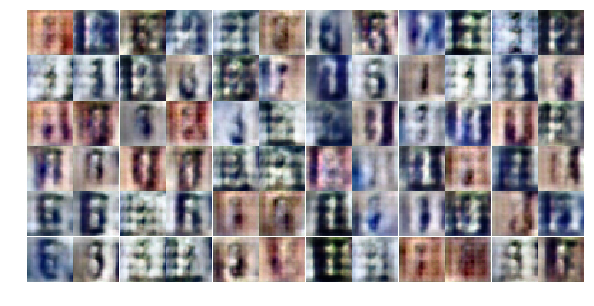

Epoch 2/20... Discriminator Loss: 0.0030... Generator Loss: 26.8315
Epoch 2/20... Discriminator Loss: 1.9967... Generator Loss: 11.3623
Epoch 2/20... Discriminator Loss: 0.8719... Generator Loss: 16.8439
Epoch 2/20... Discriminator Loss: 0.0000... Generator Loss: 34.4791
Epoch 2/20... Discriminator Loss: 3.3157... Generator Loss: 12.4253


KeyboardInterrupt: 

In [17]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))